In [1]:
import cv2
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import random
#import scipy

# Cargar datos

In [2]:
# Imágenes
dir_img_ex=r'C:\Users\kvnsg\Documents\Tesis\Deteccion\Imagenes\Explorer'
dir_img_ko=r'C:\Users\kvnsg\Documents\Tesis\Deteccion\Imagenes\Komodo'
# Imágenes de videos
dir_imgv_ex=r'C:\Users\kvnsg\Documents\Tesis\Deteccion\Imagenes-video\Explorer'
dir_imgv_ko=r'C:\Users\kvnsg\Documents\Tesis\Deteccion\Imagenes-video\Komodo'

In [3]:
# Obtener clases
clases=os.listdir(dir_img_ex)
print(clases)

['PuntoCorte', 'RayaColor']


In [4]:
# Carga las rutas de las imágenes y sus etiquetas en un DataFrame.
def load_images(clases, dir_img):
    # Inicializar listas para almacenar rutas de imágenes y etiquetas
    list_dirimg = []
    etiquetas = []

    # Iterar sobre las clases
    for clase in clases:
        # Obtener la ruta del directorio de la clase
        dir_clase = os.path.join(dir_img, clase)
        
        # Verificar si el directorio de la clase existe
        if os.path.isdir(dir_clase):
            # Iterar sobre los nombres de las imágenes en la clase
            for img_name in os.listdir(dir_clase):
                # Construir la ruta completa de la imagen
                ruta_img = os.path.join(dir_clase, img_name)
                
                # Agregar la ruta de la imagen y la etiqueta a las listas
                list_dirimg.append(ruta_img)
                etiquetas.append(clase)

    # Crear un DataFrame usando un diccionario
    df = pd.DataFrame({'ruta_imagenes': list_dirimg, 'Estado': etiquetas})

    # Devolver el DataFrame resultante
    return df

In [5]:
# Imágenes
df_explorer = load_images(clases,dir_img_ex)
df_komodo = load_images(clases,dir_img_ko)
# Imágenes de videos
df_explorerv = load_images(clases,dir_imgv_ex)
df_komodov = load_images(clases,dir_imgv_ko)

In [6]:
df_explorer.head(2)

,ruta_imagenes,Estado
0,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,PuntoCorte
1,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,PuntoCorte


In [7]:
df_komodo.head(2)

,ruta_imagenes,Estado
0,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,PuntoCorte
1,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,PuntoCorte


In [8]:
df_explorerv.head(2)

,ruta_imagenes,Estado
0,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,PuntoCorte
1,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,PuntoCorte


In [9]:
df_komodov.head(2)

,ruta_imagenes,Estado
0,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,PuntoCorte
1,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,PuntoCorte


Exploración

In [10]:
df_explorer['Estado'].value_counts()

Estado
RayaColor     90
PuntoCorte    64
Name: count, dtype: int64

In [11]:
df_komodo['Estado'].value_counts()

Estado
RayaColor     94
PuntoCorte    14
Name: count, dtype: int64

In [12]:
df_explorerv['Estado'].value_counts()

Estado
RayaColor     158
PuntoCorte    108
Name: count, dtype: int64

In [13]:
df_komodov['Estado'].value_counts()

Estado
PuntoCorte    160
RayaColor     136
Name: count, dtype: int64

In [14]:
# Concatenar verticalmente los DataFrames
df_rosas_aux = pd.concat([df_explorer, df_komodo], axis=0, ignore_index=True)
df_rosas_aux = pd.concat([df_rosas_aux, df_explorerv], axis=0, ignore_index=True)
df_rosas_aux = pd.concat([df_rosas_aux, df_komodov], axis=0, ignore_index=True)

In [15]:
df_rosas_aux['Estado'].value_counts()

Estado
RayaColor     478
PuntoCorte    346
Name: count, dtype: int64

<Axes: xlabel='Estado', ylabel='count'>

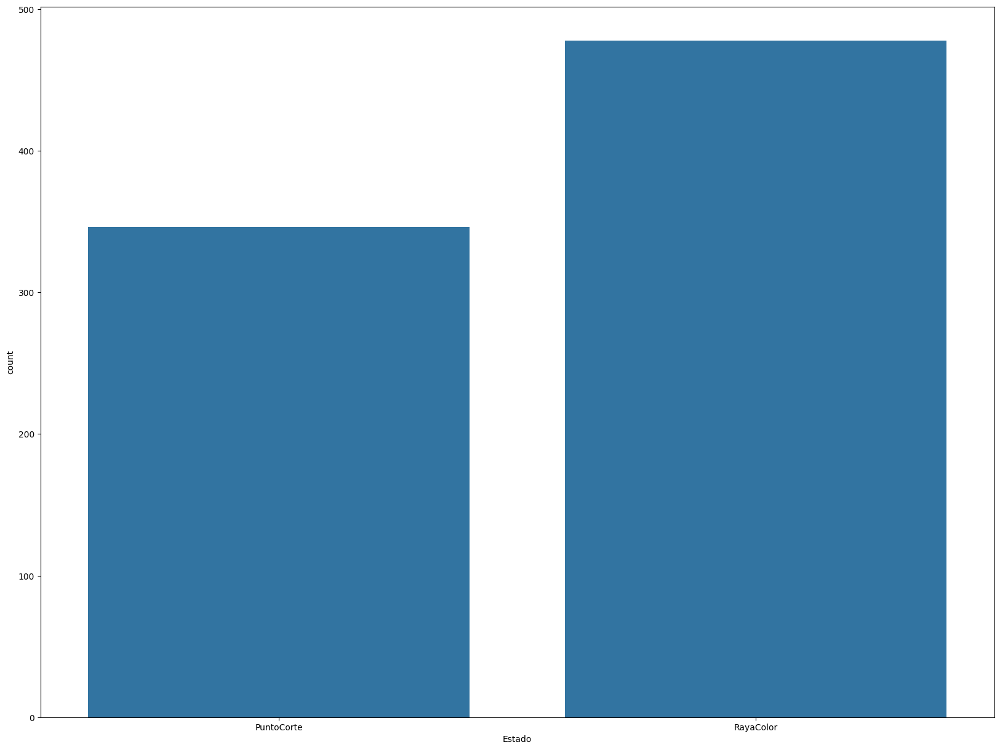

In [16]:
plt.figure(figsize=(20,15))
sns.countplot(x = 'Estado',data=df_rosas_aux)

Mostrar Imágenes

In [17]:
# Mostrar n imágenes aleatorias con la ruta de las imágenes.
def mostrar_img(df, n):
    # Calcular el número de filas necesario para mostrar n imágenes en 2 columnas
    filas = -(-n // 2)
    # Crear figura con tamaño específico
    fig = plt.figure(figsize=(15, 15))
    # Obtener el tamaño total del DataFrame
    len_t = len(df)
    # Iterar sobre el rango de 1 a
    for i in range(1, n + 1):
        # Seleccionar una ruta de imagen aleatoria
        ruta = df['ruta_imagenes'][random.randint(0, len_t - 1)]
        # Leer la imagen usando OpenCV y convertirla a formato RGB
        imgcv = cv2.imread(ruta)[:, :, ::-1]  # BGR (cv2) a RGB (matplotlib)
        # Añadir un subgráfico al diseño de filas y 2 columnas, ajustando para comenzar la numeración en 1
        ax = fig.add_subplot(filas, 2, i)
        # Mostrar la imagen en el subgráfico
        ax.imshow(imgcv)
    # Evitar superposiciones
    plt.tight_layout()
    # Mostrar la figura con todas las imágenes
    plt.show()

In [18]:
# Imágenes
komodo_rc = df_komodo[df_komodo['Estado']=='RayaColor'].reset_index(drop=True)
komodo_pc = df_komodo[df_komodo['Estado']=='PuntoCorte'].reset_index(drop=True) 
explorer_rc = df_explorer[df_explorer['Estado']=='RayaColor'].reset_index(drop=True) 
explorer_pc = df_explorer[df_explorer['Estado']=='PuntoCorte'].reset_index(drop=True) 

# Imágenes video
komodov_rc = df_komodov[df_komodov['Estado']=='RayaColor'].reset_index(drop=True)
komodov_pc = df_komodov[df_komodov['Estado']=='PuntoCorte'].reset_index(drop=True) 
explorerv_rc = df_explorerv[df_explorerv['Estado']=='RayaColor'].reset_index(drop=True) 
explorerv_pc = df_explorerv[df_explorerv['Estado']=='PuntoCorte'].reset_index(drop=True) 

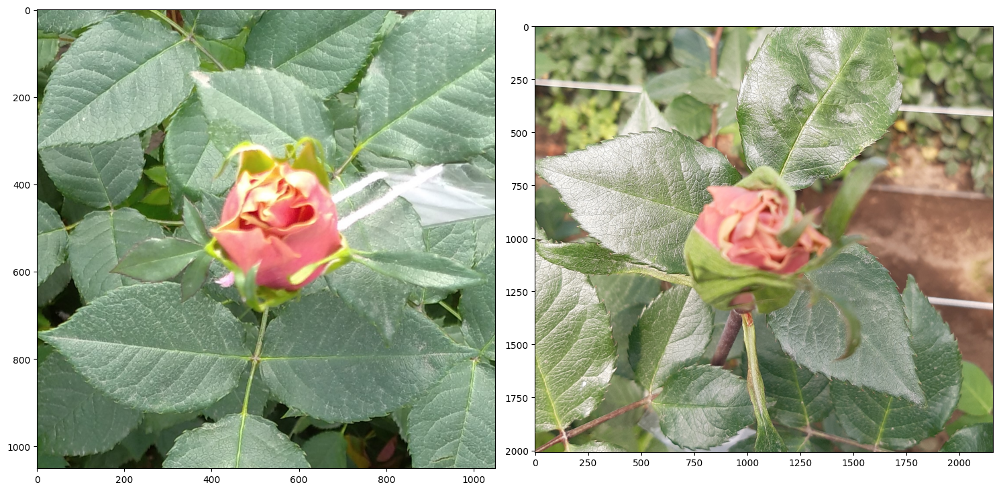

In [52]:
# Komodo Raya Color
mostrar_img(komodo_rc,2)

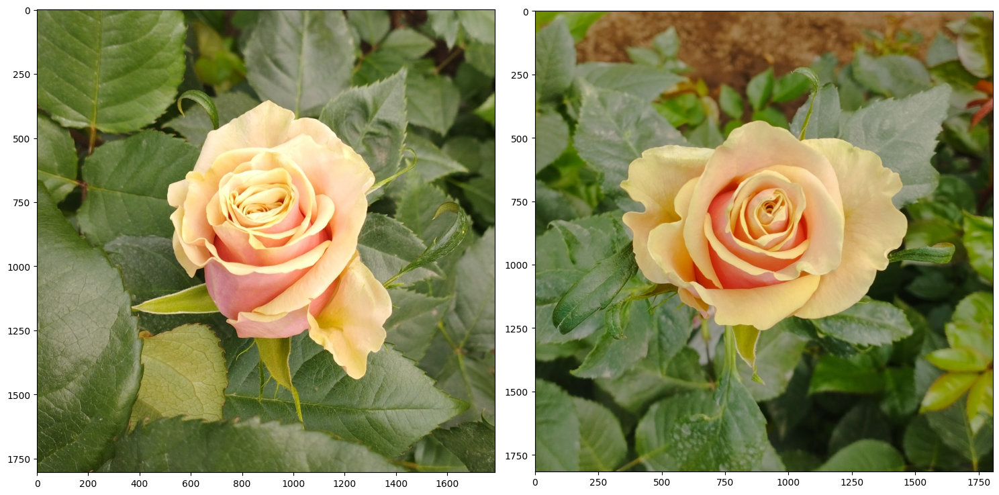

In [16]:
# Komodo Punto de Corte
mostrar_img(komodo_pc,2)

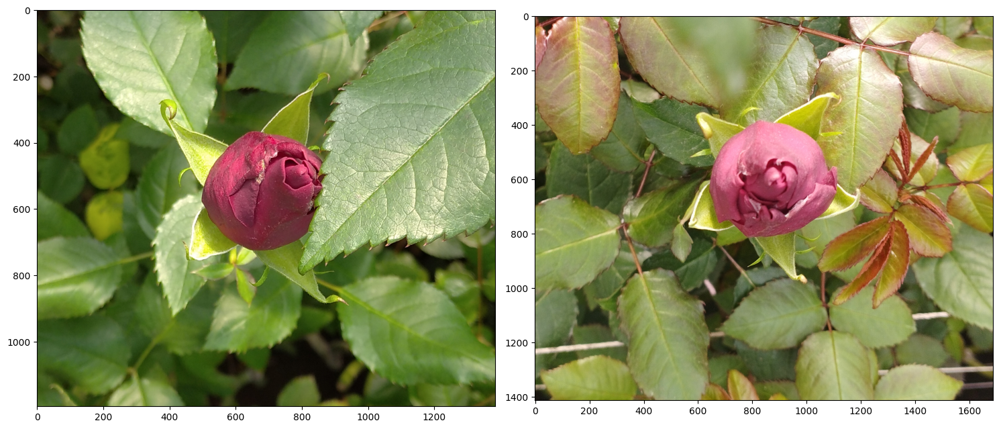

In [17]:
# Explorer Raya Color
mostrar_img(explorer_rc,2)

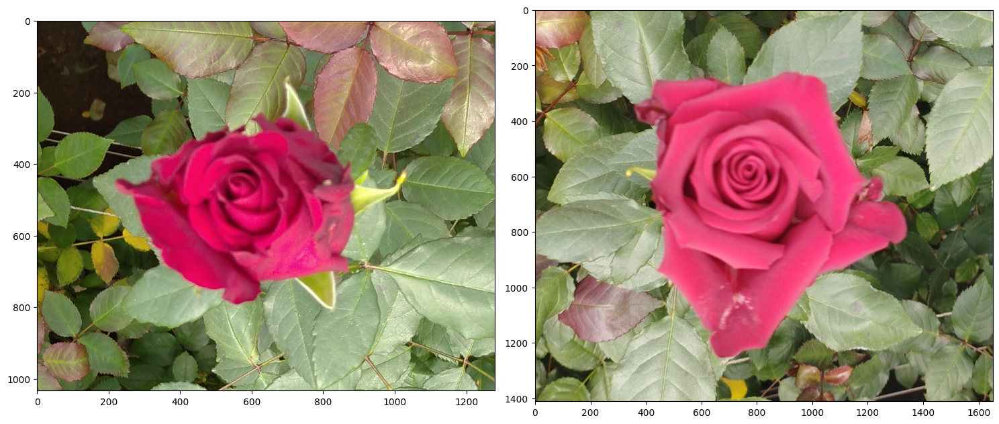

In [18]:
# Explorer Punto de Corte
mostrar_img(explorer_pc,2)

# Pre procesamiento

In [19]:
# Función para redimensionar la imágen
def procesar_imagen(ruta, size):
    # Leer la imagen con OpenCV
    imagen = cv2.imread(ruta)

    # Redimensionar la imagen
    nueva_dimension = (size, size)
    imagen_redimensionada = cv2.resize(imagen, nueva_dimension)

    return imagen_redimensionada

In [20]:
# Aplicar la redimensión a las imágenes
# Imágenes
komodo_rc['imagen_modificada'] = komodo_rc['ruta_imagenes'].apply(procesar_imagen, size = 900)
komodo_pc['imagen_modificada'] = komodo_pc['ruta_imagenes'].apply(procesar_imagen, size = 900)
explorer_rc['imagen_modificada'] = explorer_rc['ruta_imagenes'].apply(procesar_imagen, size = 900)
explorer_pc['imagen_modificada'] = explorer_pc['ruta_imagenes'].apply(procesar_imagen, size = 900)

# Imágenes con video
komodov_rc['imagen_modificada'] = komodov_rc['ruta_imagenes'].apply(procesar_imagen, size = 900)
komodov_pc['imagen_modificada'] = komodov_pc['ruta_imagenes'].apply(procesar_imagen, size = 900)
explorerv_rc['imagen_modificada'] = explorerv_rc['ruta_imagenes'].apply(procesar_imagen, size = 900)
explorerv_pc['imagen_modificada'] = explorerv_pc['ruta_imagenes'].apply(procesar_imagen, size = 900)

In [21]:
# Concatenar verticalmente los DataFrames
komodo_rc = pd.concat([komodo_rc, komodov_rc], axis=0, ignore_index=True)
komodo_pc = pd.concat([komodo_pc, komodov_pc], axis=0, ignore_index=True)
explorer_rc = pd.concat([explorer_rc, explorerv_rc], axis=0, ignore_index=True)
explorer_pc = pd.concat([explorer_pc, explorerv_pc], axis=0, ignore_index=True)

In [22]:
print(f" Komodo-rc: {len(komodo_rc['Estado'])}, Komodo-pc: {len(komodo_pc['Estado'])}, Explorer-rc: {len(explorer_rc['Estado'])}, Explorer-pc: {len(explorer_pc['Estado'])}")

 Komodo-rc: 230, Komodo-pc: 174, Explorer-rc: 248, Explorer-pc: 172


In [23]:
explorer_pc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172 entries, 0 to 171
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   ruta_imagenes      172 non-null    object
 1   Estado             172 non-null    object
 2   imagen_modificada  172 non-null    object
dtypes: object(3)
memory usage: 4.2+ KB


In [24]:
explorer_rc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 248 entries, 0 to 247
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   ruta_imagenes      248 non-null    object
 1   Estado             248 non-null    object
 2   imagen_modificada  248 non-null    object
dtypes: object(3)
memory usage: 5.9+ KB


In [25]:
komodo_rc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 230 entries, 0 to 229
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   ruta_imagenes      230 non-null    object
 1   Estado             230 non-null    object
 2   imagen_modificada  230 non-null    object
dtypes: object(3)
memory usage: 5.5+ KB


In [26]:
komodo_pc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174 entries, 0 to 173
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   ruta_imagenes      174 non-null    object
 1   Estado             174 non-null    object
 2   imagen_modificada  174 non-null    object
dtypes: object(3)
memory usage: 4.2+ KB


In [27]:
imagen_modificada =explorer_rc['imagen_modificada'][0]

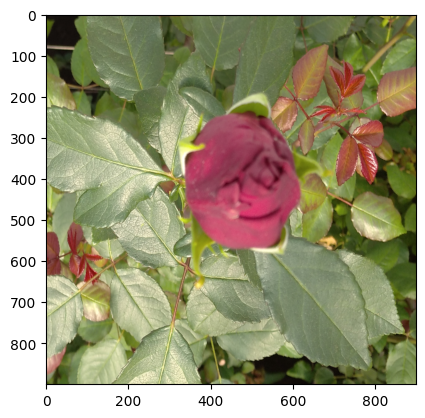

In [28]:
plt.imshow( imagen_modificada[:, :, ::-1])

In [29]:
imagen_modificada.shape

(900, 900, 3)

In [30]:
imagen_modificada

array([[[ 16,  21,  24],
        [ 15,  20,  23],
        [ 12,  17,  20],
        ...,
        [ 78, 145, 170],
        [ 80, 146, 172],
        [ 80, 147, 173]],

       [[ 15,  20,  23],
        [ 14,  19,  22],
        [ 13,  18,  21],
        ...,
        [ 78, 149, 173],
        [ 79, 148, 173],
        [ 79, 147, 174]],

       [[ 13,  18,  19],
        [ 13,  18,  21],
        [ 12,  17,  20],
        ...,
        [ 77, 150, 174],
        [ 79, 150, 174],
        [ 81, 150, 176]],

       ...,

       [[ 19,  92,  76],
        [ 13,  88,  72],
        [ 15,  88,  72],
        ...,
        [ 95, 158, 139],
        [ 95, 157, 138],
        [ 91, 151, 133]],

       [[ 11,  90,  73],
        [ 11,  89,  72],
        [ 14,  88,  72],
        ...,
        [ 98, 160, 142],
        [ 96, 157, 139],
        [ 97, 156, 139]],

       [[ 10,  91,  73],
        [ 12,  90,  73],
        [ 14,  89,  73],
        ...,
        [101, 161, 143],
        [101, 160, 142],
        [ 99, 157, 140]]

Dividir conjuntos para pruebas

In [31]:
# Dividir conjunto de datos
def dividir_datos(df_img, porcentaje):
    train_df, test_df=train_test_split(df_img, train_size = porcentaje, shuffle=True, random_state=10)
    return train_df, test_df

In [32]:
temp_komodo_rc, test_komodo_rc = dividir_datos(komodo_rc, 0.85)
print ('temp_df: ', len(temp_komodo_rc), '  test_df: ', len(test_komodo_rc))    

temp_df:  195   test_df:  35


In [33]:
temp_komodo_pc, test_komodo_pc = dividir_datos(komodo_pc, 0.85)
print ('temp_df: ', len(temp_komodo_pc), '  test_df: ', len(test_komodo_pc))

temp_df:  147   test_df:  27


In [34]:
temp_explorer_rc, test_explorer_rc = dividir_datos(explorer_rc, 0.85)
print ('temp_df: ', len(temp_explorer_rc), '  test_df: ', len(test_explorer_rc))

temp_df:  210   test_df:  38


In [35]:
temp_explorer_pc, test_explorer_pc = dividir_datos(explorer_pc, 0.85)
print ('temp_df: ', len(temp_explorer_pc), '  test_df: ', len(test_explorer_pc))

temp_df:  146   test_df:  26


In [70]:
def guardar_img(df, carpeta_destino, nombre):
    # Recorrer todas las imágenes
    for i, imagen_modificada in enumerate(df['imagen_modificada']):
        # Guardar la imagen
        ruta_destino = f'{carpeta_destino}/{nombre}_{i}.png'
        cv2.imwrite(ruta_destino, imagen_modificada)  

Guardar imágenes para pruebas

In [71]:
carpeta_test = 'C:/Users/kvnsg/Documents/Tesis/Deteccion/Datasets/images/test'

In [74]:
guardar_img(test_komodo_rc, carpeta_test, 'test_komodo_rc')
guardar_img(test_komodo_pc, carpeta_test, 'test_komodo_pc')
guardar_img(test_explorer_rc, carpeta_test, 'test_explorer_rc')
guardar_img(test_explorer_pc, carpeta_test, 'test_explorer_pc')

# Aumento de datos

In [131]:
# Configuración de transformaciones

def cambiar_brillo(img):
    img_augmented = img
    
    # Cambiar el brillo de una imagen con una probabilidad del 20%
    if random.uniform(0, 1) > 0.2:
        # Generar un factor de brillo aleatorio
        brightness_factor = np.random.uniform(0.65, 1.2)
        
        # Multiplicar el factor con cada píxel de la imagen, para ajustar el brillo
        img_augmented *= brightness_factor
        
        # Mantener los píxeles entre 0 y 1
        img_augmented = np.clip(img_augmented, 0, 1)
    
    return img_augmented


transformaciones = ImageDataGenerator(
    horizontal_flip = True,  # Invierte la imágen de manera horizontal
    vertical_flip = True,   # Voltea la imágen de manera vertical
    rotation_range = 45,     # Rota la imágen en el rango de -45 a 45 grados
    fill_mode="reflect",
    preprocessing_function=cambiar_brillo,

)

In [132]:
def generar_imagen(df, total_size, estado, transformaciones = transformaciones):
    # Crear DataFrame para las imágenes generadas
    df_aumento = pd.DataFrame()
    # Copiar el DataFrame
    df_copy = df.copy()
    # Reiniciar los índices
    df_copy = df_copy.reset_index(drop=True)
    # Calcular número de aumento
    num_aumento = total_size - len(df_copy)
    for _ in range(num_aumento):
        # Tomar aleatoriamente una imagen
        imagen_random = df_copy['imagen_modificada'].sample(1).iloc[0]
        # Agregar la dimensión del batch 
        imagen_expandida = np.expand_dims(imagen_random, axis=0)  
        # Aplicar las transformaciones
        imagen_aumentada = transformaciones.flow(imagen_expandida/255.0).next()
        # Crear un nuevo DataFrame con la imagen expandida
        nueva_fila = pd.DataFrame({'ruta_imagenes': [''], 'Estado': [estado], 'imagen_modificada': [ (imagen_aumentada[0]*255).astype(int) ]})

        # Agregar la nueva fila al DataFrame original
        df_aumento = pd.concat([df_aumento, nueva_fila], ignore_index=True)
    return df_aumento

In [133]:
prueba = temp_komodo_rc['imagen_modificada'].sample(1).iloc[0]
prueba = np.expand_dims(prueba, axis=0)

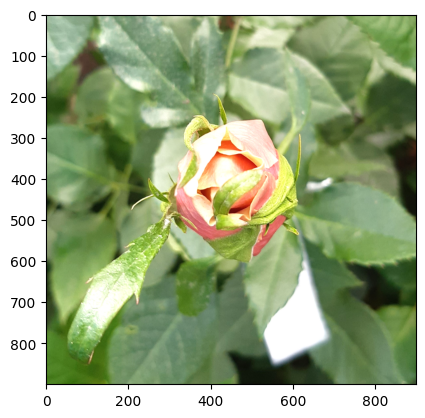

In [129]:
imagen_aumentada = transformaciones.flow(prueba/255.0).next()
plt.imshow( imagen_aumentada[0][:, :, ::-1])

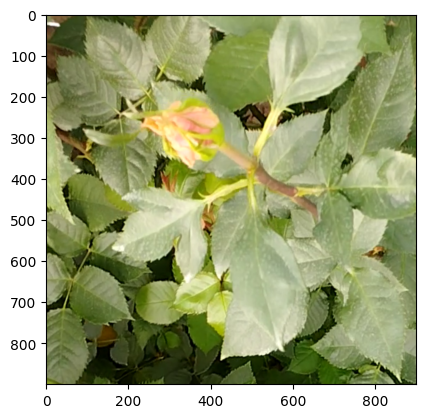

In [43]:
aumento_komodo_rc = generar_imagen(temp_komodo_rc, 250, 'RayaColor')
img_aux = aumento_komodo_rc['imagen_modificada'][1]
plt.imshow( img_aux[:, :, ::-1])

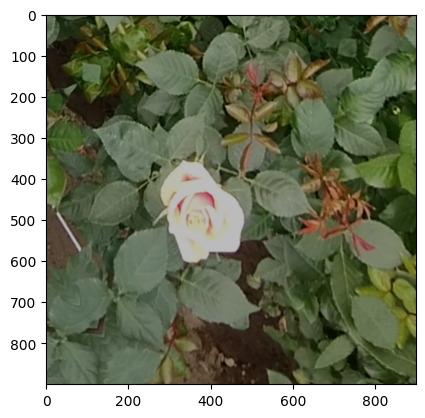

In [82]:
aumento_komodo_pc = generar_imagen(temp_komodo_pc, 250, 'PuntoCorte')
img_aux = aumento_komodo_pc['imagen_modificada'][1]
plt.imshow( img_aux[:, :, ::-1])

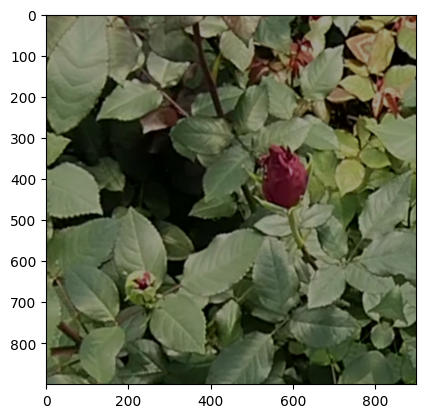

In [83]:
aumento_explorer_rc = generar_imagen(temp_explorer_rc, 250, 'RayaColor')
img_aux = aumento_explorer_rc['imagen_modificada'][2]
plt.imshow( img_aux[:, :, ::-1])

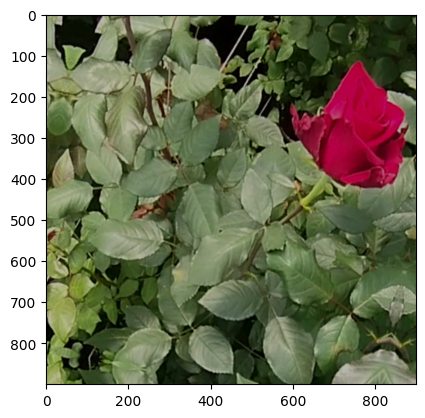

In [84]:
aumento_explorer_pc = generar_imagen(temp_explorer_pc, 250, 'PuntoCorte')
img_aux = aumento_explorer_pc['imagen_modificada'][1]
plt.imshow( img_aux[:, :, ::-1])

In [85]:
rc_aux = pd.concat([temp_komodo_rc, aumento_komodo_rc], axis=0, ignore_index=True)
rc_aux = pd.concat([rc_aux, aumento_explorer_rc], axis=0, ignore_index=True)
rc_aux = pd.concat([rc_aux, temp_explorer_rc], axis=0, ignore_index=True)

In [86]:
pc_aux = pd.concat([temp_komodo_pc, aumento_komodo_pc], axis=0, ignore_index=True)
pc_aux = pd.concat([pc_aux, aumento_explorer_pc], axis=0, ignore_index=True)
pc_aux = pd.concat([pc_aux, temp_explorer_pc], axis=0, ignore_index=True)

In [87]:
rosas_aumento_aux = pd.concat([rc_aux, pc_aux], axis=0, ignore_index=True)

In [88]:
rosas_aumento_aux['Estado'].value_counts()

Estado
RayaColor     500
PuntoCorte    500
Name: count, dtype: int64

<Axes: xlabel='Estado', ylabel='count'>

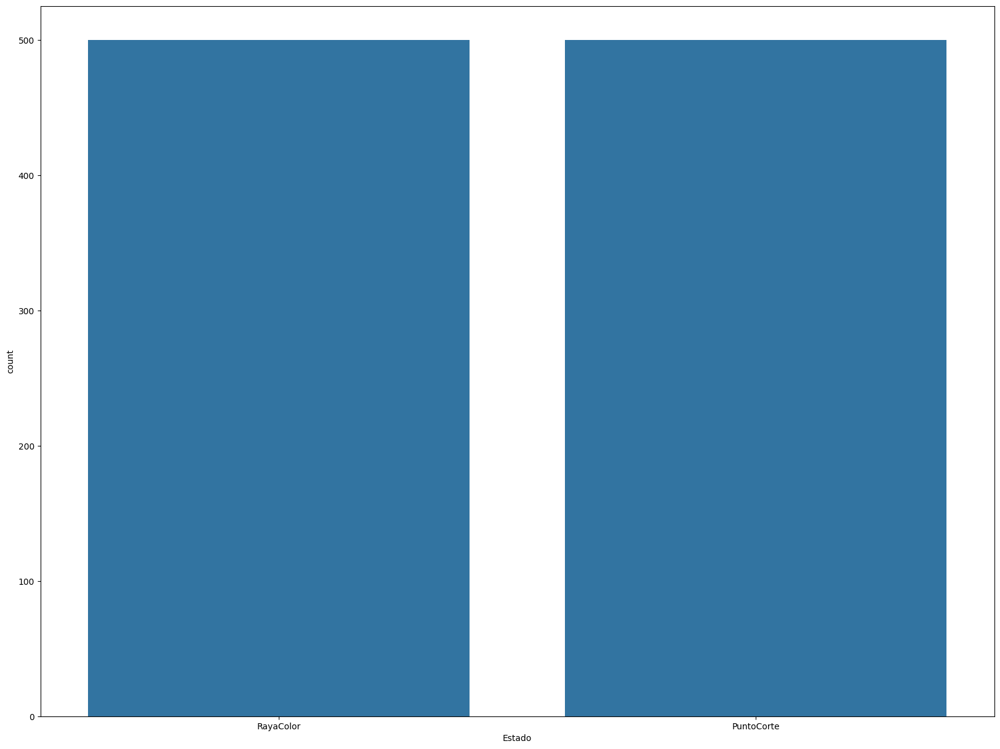

In [89]:
plt.figure(figsize=(20,15))
sns.countplot(x = 'Estado',data=rosas_aumento_aux)

In [90]:
rc_aux.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   ruta_imagenes      500 non-null    object
 1   Estado             500 non-null    object
 2   imagen_modificada  500 non-null    object
dtypes: object(3)
memory usage: 11.8+ KB


Dividir conjuntos en entrenamiento y validación

In [91]:
train_rosas, val_rosas = train_test_split(rosas_aumento_aux, train_size = 0.85, shuffle=True, random_state=10, stratify=rosas_aumento_aux['Estado'])
print ('train_df: ', len(train_rosas), '  val_df: ', len(val_rosas)) 

train_df:  850   val_df:  150


In [92]:
train_rosas.head()

,ruta_imagenes,Estado,imagen_modificada
191,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,RayaColor,"[[[91, 111, 142], [93, 113, 144], [94, 113, 14..."
307,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,RayaColor,"[[[97, 127, 144], [113, 146, 160], [118, 159, ..."
404,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,RayaColor,"[[[10, 40, 45], [18, 45, 51], [28, 52, 60], [3..."
694,,PuntoCorte,"[[[16, 25, 23], [15, 24, 21], [13, 22, 20], [1..."
567,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,PuntoCorte,"[[[19, 90, 66], [19, 90, 66], [22, 94, 69], [3..."


In [93]:
val_rosas.head()

,ruta_imagenes,Estado,imagen_modificada
407,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,RayaColor,"[[[113, 199, 193], [115, 201, 195], [113, 199,..."
994,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,PuntoCorte,"[[[2, 42, 18], [1, 41, 16], [0, 38, 14], [2, 4..."
474,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,RayaColor,"[[[53, 104, 90], [49, 95, 82], [49, 93, 78], [..."
290,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,RayaColor,"[[[98, 148, 122], [98, 147, 123], [98, 146, 12..."
562,C:\Users\kvnsg\Documents\Tesis\Deteccion\Image...,PuntoCorte,"[[[31, 48, 64], [30, 47, 63], [28, 45, 61], [2..."


In [94]:
train_rosas['Estado'].value_counts()

Estado
RayaColor     425
PuntoCorte    425
Name: count, dtype: int64

In [95]:
val_rosas['Estado'].value_counts()

Estado
RayaColor     75
PuntoCorte    75
Name: count, dtype: int64

Guardar imágenes para entrenamiento y validación

In [96]:
def guardar_img_train(df, carpeta_destino, nombre):
    estado = ''
    num_pc = 0
    num_rc = 0
    num = 0
    # Reindexar 
    df_copy = df.reset_index(drop = True)
    # Recorrer todas las imágenes
    for i in range(len(df_copy)):
        # Identificar estado
        if df_copy['Estado'][i] == 'RayaColor':
            estado = 'rc'
            num_rc = num_rc + 1 
            num = num_rc
        if df_copy['Estado'][i] == 'PuntoCorte':
            estado = 'pc'
            num_pc = num_pc + 1 
            num = num_pc
        
        imagen = df_copy['imagen_modificada'][i]
                
        # Guardar la imagen
        ruta_destino = f'{carpeta_destino}/{nombre}_{estado}_{num}.png'
        cv2.imwrite(ruta_destino, imagen)  

In [97]:
carpeta_train = 'C:/Users/kvnsg/Documents/Tesis/Deteccion/Datasets/images/train'
carpeta_val = 'C:/Users/kvnsg/Documents/Tesis/Deteccion/Datasets/images/validation'

In [98]:
guardar_img_train(val_rosas, carpeta_val, 'val')
guardar_img_train(train_rosas, carpeta_train, 'train')